In [1]:
from importlib import reload
import sys
import os
sys.path.insert(0, './../scripts')

In [2]:
import pickle
import numpy as np
from scipy.interpolate import interp1d,RegularGridInterpolator
from scipy.optimize import least_squares,root
import matplotlib as mpl
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.figure import figaspect
import time

import base_network as base_network
import ring_network as ring_network
import spat_ori_network as network
import sim_util as su
import ricciardi as ric
import integrate as integ

def addcbar(fig,ax,plot,size='5%',pad=0.05):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size=size, pad=pad)
    cbar = fig.colorbar(plot, cax=cax, orientation='vertical')
    return cbar

# Build One Pop Ring Network with Cosine Connectivity

In [3]:
Nori = 180
Ncol = 1
N = Nori*Ncol

net = ring_network.RingNetwork(NC=[Ncol],Nori=Nori)

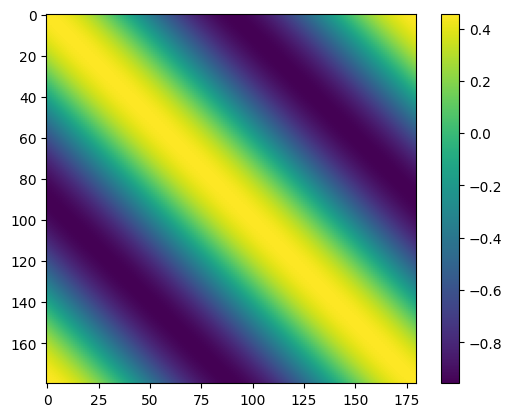

In [13]:
J = (-0.25+0.5*np.sqrt(2)*np.cos(net.get_ori_diff()*2*np.pi/180)) / N# + 0.01*np.random.default_rng(0).normal(size=(N,N))/np.sqrt(N)
plt.imshow(J*N)
plt.colorbar()

# Calculate Singular Vectors

In [11]:
U,S,Vh = np.linalg.svd(J)

nrank = 3

m = U[:,:nrank].T*np.sqrt(N)*np.sqrt(S[:nrank,None])
n = Vh[:nrank,:]*np.sqrt(N)*np.sqrt(S[:nrank,None])

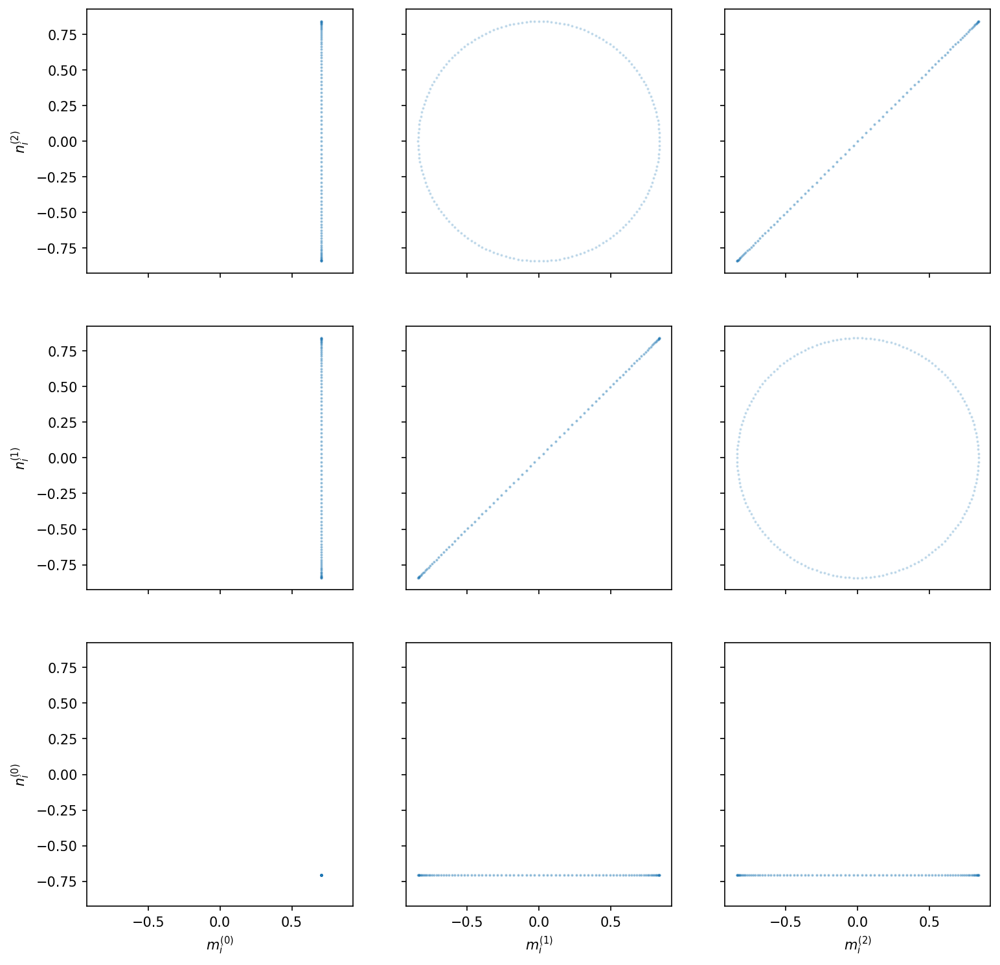

In [218]:
fig,axs = plt.subplots(nrank,nrank,figsize=(4*nrank,4*nrank),dpi=150,sharex=True,sharey=True)

for i in range(nrank):
    axs[nrank-1-i,0].set_ylabel(r'$n_i^{('+str(i)+r')}$')
    axs[nrank-1,i].set_xlabel(r'$m_i^{('+str(i)+r')}$')
    for j in range(nrank):
        axs[nrank-1-i,j].scatter(m[j],n[i],s=1,alpha=0.2)

# Solve Latents with Rectified Quadratic

In [3]:
from scipy.special import binom
from mpmath import fp

def auxfun(k,a):
    if a < -1:
        return (k-1)%2 * 2**(-0.5*k) * binom(k,k//2)
    elif a < 1:
        return 2**(k/2)/(2*np.pi)*(np.sqrt(np.pi)*fp.gamma(0.5*(k+1))/fp.gamma(0.5*k+1)-\
            2*a**(k+1)/(k+1)*fp.hyp2f1(0.5,0.5*(k+1),0.5*(k+3),a**2))
    else:
        return 0

Text(0, 0.5, 'Auxiliary Function')

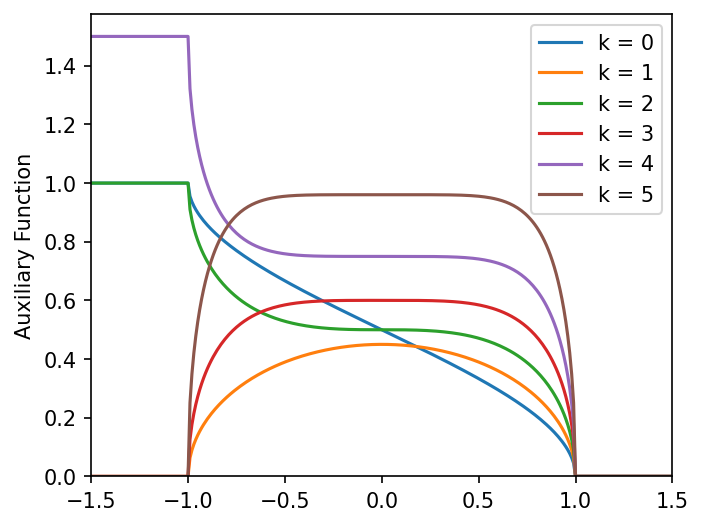

In [42]:
fig,axs = plt.subplots(1,1,figsize=(5,4),dpi=150)

xs = np.linspace(-1.5,1.5,301)

for k in range(6):
    axs.plot(xs,[auxfun(k,x) for x in xs],label='k = {:d}'.format(k))
    
axs.legend()
    
axs.set_xlim(xs[0],xs[-1])
axs.set_ylim(0,None)

axs.set_ylabel('Auxiliary Function')

In [4]:
from scipy.integrate import solve_ivp

def rate_overlap(kap0,kapc,kaps,n):
    kap1 = np.sqrt(kapc**2+kaps**2)
    a = -kap0/(np.sqrt(2)*kap1)
    ovrlps = np.zeros(3)
    for k in range(n+1):
        ovrlps[0] += binom(n,k)*auxfun(k,a)  *kap0**(n-k)*kap1**k
        ovrlps[1] += binom(n,k)*auxfun(k+1,a)*kap0**(n-k)*kap1**(k-1)*kapc
        ovrlps[2] += binom(n,k)*auxfun(k+1,a)*kap0**(n-k)*kap1**(k-1)*kaps
    return ovrlps

def stab_fix_pt_dkapdt(t,kap,J0,J1,I0,I1,n):
    ovrlps = rate_overlap(kap[0],kap[1],0,n)
    return np.array([I0+J0*ovrlps[0],I1*np.sqrt(2)+J1*ovrlps[1]]) - kap

def othr_fix_pt_dkapdt(t,kap,J0,J1,I0,I1,n):
    kapc = I1*np.sqrt(2)/(1-J1)
    ovrlps = rate_overlap(kap[0],0,kap[1],n)
    return np.array([I0+J0*ovrlps[0],J1*ovrlps[2]]) - kap

In [514]:
from tqdm import tqdm

J0 = -1.0*0.04
J1 = 0.5*0.04
I0s = np.linspace(0,6,31)
I1s = np.linspace(0,2,21)

k0s = np.zeros((len(I0s),len(I1s)))
kcs = np.zeros((len(I0s),len(I1s)))
kss = np.zeros((len(I0s),len(I1s)))
r0s = np.zeros((len(I0s),len(I1s)))
rcs = np.zeros((len(I0s),len(I1s)))
rss = np.zeros((len(I0s),len(I1s)))
err = np.zeros((len(I0s),len(I1s)))

for i,I0 in tqdm(enumerate(I0s)):
    for j,I1 in tqdm(enumerate(I1s),leave=False):
        sol = solve_ivp(stab_fix_pt_dkapdt,(0,50),[-0.1,0.01],args=(J0,J1,I0,I1,2))
        k0s[i,j] = sol.y[0,-1]
        kcs[i,j] = sol.y[1,-1]
        kss[i,j] = 0
        
        r0s[i,j],rcs[i,j],rss[i,j] = rate_overlap(k0s[i,j],kcs[i,j],kss[i,j],2)
        err[i,j] = np.linalg.norm(stab_fix_pt_dkapdt(0,[k0s[i,j],kcs[i,j]],J0,J1,I0s[i],I1s[j],2))
        
stab_idxs = err < 1e-2
tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(I1s[None,:]/(I0s[:,None]-2),0.5))
tune3_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==4),np.isclose(I1s[None,:]/(I0s[:,None]-4),0.5))

0it [00:00, ?it/s]
3it [00:00, 25.15it/s]

31it [00:35,  1.16s/it]
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1652282370.py:27: RuntimeWarning: divide by zero encountered in divide
  tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1652282370.py:27: RuntimeWarning: invalid value encountered in divide
  tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1652282370.py:28: RuntimeWarning: divide by zero encountered in divide
  tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(I1s[None,:]/(I0s[:,None]-2),0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1652282370.py:28: RuntimeWarning: invalid value encountered in divide
  tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.iscl

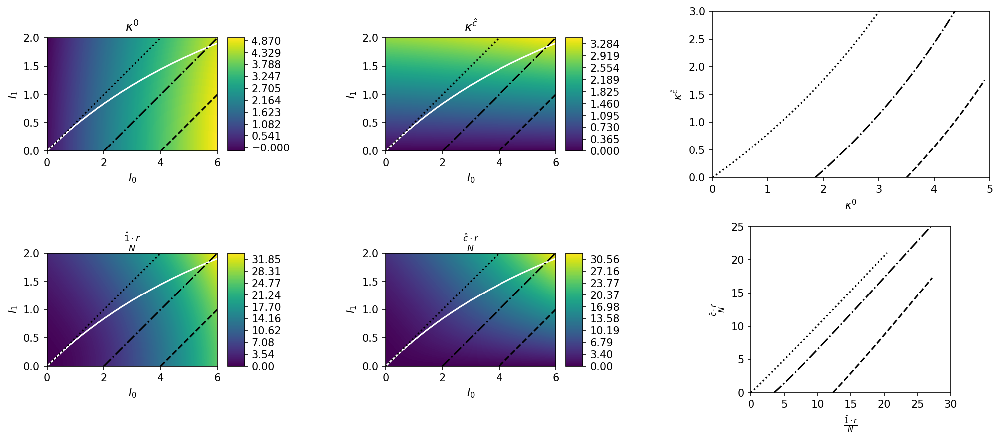

In [515]:
fig,axs = plt.subplots(2,3,figsize=(15,6),dpi=150,width_ratios=[2,2,3])
# fig.subplots_adjust(wspace=1)

conts = np.zeros_like(axs)
conts[0,0] = axs[0,0].contourf(I0s,I1s,k0s.T,
    levels=np.linspace(np.min(k0s[stab_idxs]),np.max(k0s[stab_idxs]),201),cmap='viridis')
conts[0,1] = axs[0,1].contourf(I0s,I1s,kcs.T,
    levels=np.linspace(np.min(kcs[stab_idxs]),np.max(kcs[stab_idxs]),201),cmap='viridis')
axs[0,2].plot(k0s[tune1_idxs],kcs[tune1_idxs],'k:')
axs[0,2].plot(k0s[tune2_idxs],kcs[tune2_idxs],'k-.')
axs[0,2].plot(k0s[tune3_idxs],kcs[tune3_idxs],'k--')
conts[1,0] = axs[1,0].contourf(I0s,I1s,r0s.T,
    levels=np.linspace(np.min(r0s[stab_idxs]),np.max(r0s[stab_idxs]),201),cmap='viridis')
conts[1,1] = axs[1,1].contourf(I0s,I1s,rcs.T,
    levels=np.linspace(np.min(rcs[stab_idxs]),np.max(rcs[stab_idxs]),201),cmap='viridis')
axs[1,2].plot(r0s[tune1_idxs],rcs[tune1_idxs],'k:')
axs[1,2].plot(r0s[tune2_idxs],rcs[tune2_idxs],'k-.')
axs[1,2].plot(r0s[tune3_idxs],rcs[tune3_idxs],'k--')

for i in range(2):
    for j in range(2):
        addcbar(fig,axs[i,j],conts[i,j],pad=-1)
        axs[i,j].set_xlabel(r'$I_0$')
        axs[i,j].set_ylabel(r'$I_1$')
        axs[i,j].set_aspect(2)
        axs[i,j].contour(I0s,I1s,(-k0s/(np.sqrt(2)*kcs)).T,levels=[-1],colors='w',linestyles='-')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - I0s[:,None]).T,levels=[0],colors='k',linestyles=':')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-2)).T,levels=[0],colors='k',linestyles='-.')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-4)).T,levels=[0],colors='k',linestyles='--')
    axs[i,2].set_aspect('equal')
    
axs[0,2].set_xlim(0,5)
axs[0,2].set_ylim(0,3)
axs[1,2].set_xlim(0,30)
axs[1,2].set_ylim(0,25)
    
axs[0,0].set_title(r'$\kappa^0$')
axs[0,1].set_title(r'$\kappa^{\hat{c}}$')
axs[0,2].set_xlabel(r'$\kappa^0$')
axs[0,2].set_ylabel(r'$\kappa^{\hat{c}}$')
axs[1,0].set_title(r'$\frac{\hat{1}\cdot r}{N}$')
axs[1,1].set_title(r'$\frac{\hat{c}\cdot r}{N}$')
axs[1,2].set_xlabel(r'$\frac{\hat{1}\cdot r}{N}$')
axs[1,2].set_ylabel(r'$\frac{\hat{c}\cdot r}{N}$')

fig.tight_layout()

In [517]:
from tqdm import tqdm

J0 = -0.5*0.04
J1 = 0.5*0.04
I0s = np.linspace(0,6,31)
I1s = np.linspace(0,2,21)

k0s = np.zeros((len(I0s),len(I1s)))
kcs = np.zeros((len(I0s),len(I1s)))
kss = np.zeros((len(I0s),len(I1s)))
r0s = np.zeros((len(I0s),len(I1s)))
rcs = np.zeros((len(I0s),len(I1s)))
rss = np.zeros((len(I0s),len(I1s)))
err = np.zeros((len(I0s),len(I1s)))

for i,I0 in tqdm(enumerate(I0s)):
    for j,I1 in tqdm(enumerate(I1s),leave=False):
        sol = solve_ivp(stab_fix_pt_dkapdt,(0,50),[-0.1,0.01],args=(J0,J1,I0,I1,2))
        k0s[i,j] = sol.y[0,-1]
        kcs[i,j] = sol.y[1,-1]
        kss[i,j] = 0
        
        r0s[i,j],rcs[i,j],rss[i,j] = rate_overlap(k0s[i,j],kcs[i,j],kss[i,j],2)
        err[i,j] = np.linalg.norm(stab_fix_pt_dkapdt(0,[k0s[i,j],kcs[i,j]],J0,J1,I0s[i],I1s[j],2))
        
stab_idxs = err < 1e-2
tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(I1s[None,:]/(I0s[:,None]-2),0.5))
tune3_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==4),np.isclose(I1s[None,:]/(I0s[:,None]-4),0.5))

31it [00:32,  1.06s/it]
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/315816979.py:27: RuntimeWarning: divide by zero encountered in divide
  tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/315816979.py:27: RuntimeWarning: invalid value encountered in divide
  tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/315816979.py:28: RuntimeWarning: divide by zero encountered in divide
  tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(I1s[None,:]/(I0s[:,None]-2),0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/315816979.py:28: RuntimeWarning: invalid value encountered in divide
  tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(

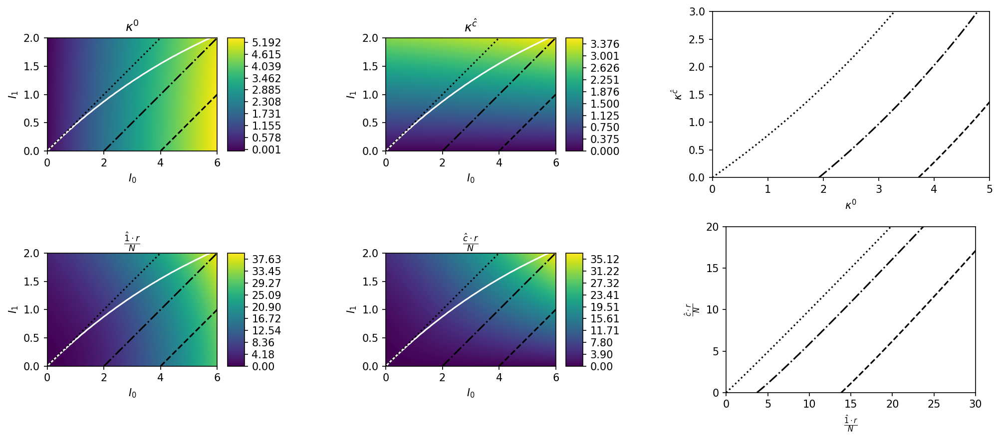

In [518]:
fig,axs = plt.subplots(2,3,figsize=(15,6),dpi=150,width_ratios=[2,2,3])
# fig.subplots_adjust(wspace=1)

conts = np.zeros_like(axs)
conts[0,0] = axs[0,0].contourf(I0s,I1s,k0s.T,
    levels=np.linspace(np.min(k0s[stab_idxs]),np.max(k0s[stab_idxs]),201),cmap='viridis')
conts[0,1] = axs[0,1].contourf(I0s,I1s,kcs.T,
    levels=np.linspace(np.min(kcs[stab_idxs]),np.max(kcs[stab_idxs]),201),cmap='viridis')
axs[0,2].plot(k0s[tune1_idxs],kcs[tune1_idxs],'k:')
axs[0,2].plot(k0s[tune2_idxs],kcs[tune2_idxs],'k-.')
axs[0,2].plot(k0s[tune3_idxs],kcs[tune3_idxs],'k--')
conts[1,0] = axs[1,0].contourf(I0s,I1s,r0s.T,
    levels=np.linspace(np.min(r0s[stab_idxs]),np.max(r0s[stab_idxs]),201),cmap='viridis')
conts[1,1] = axs[1,1].contourf(I0s,I1s,rcs.T,
    levels=np.linspace(np.min(rcs[stab_idxs]),np.max(rcs[stab_idxs]),201),cmap='viridis')
axs[1,2].plot(r0s[tune1_idxs],rcs[tune1_idxs],'k:')
axs[1,2].plot(r0s[tune2_idxs],rcs[tune2_idxs],'k-.')
axs[1,2].plot(r0s[tune3_idxs],rcs[tune3_idxs],'k--')

for i in range(2):
    for j in range(2):
        addcbar(fig,axs[i,j],conts[i,j],pad=-1)
        axs[i,j].set_xlabel(r'$I_0$')
        axs[i,j].set_ylabel(r'$I_1$')
        axs[i,j].set_aspect(2)
        axs[i,j].contour(I0s,I1s,(-k0s/(np.sqrt(2)*kcs)).T,levels=[-1],colors='w',linestyles='-')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - I0s[:,None]).T,levels=[0],colors='k',linestyles=':')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-2)).T,levels=[0],colors='k',linestyles='-.')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-4)).T,levels=[0],colors='k',linestyles='--')
    axs[i,2].set_aspect('equal')
    
axs[0,2].set_xlim(0,5)
axs[0,2].set_ylim(0,3)
axs[1,2].set_xlim(0,30)
axs[1,2].set_ylim(0,20)
    
axs[0,0].set_title(r'$\kappa^0$')
axs[0,1].set_title(r'$\kappa^{\hat{c}}$')
axs[0,2].set_xlabel(r'$\kappa^0$')
axs[0,2].set_ylabel(r'$\kappa^{\hat{c}}$')
axs[1,0].set_title(r'$\frac{\hat{1}\cdot r}{N}$')
axs[1,1].set_title(r'$\frac{\hat{c}\cdot r}{N}$')
axs[1,2].set_xlabel(r'$\frac{\hat{1}\cdot r}{N}$')
axs[1,2].set_ylabel(r'$\frac{\hat{c}\cdot r}{N}$')

fig.tight_layout()

In [519]:
from tqdm import tqdm

J0 = 0*0.04
J1 = 0.5*0.04
I0s = np.linspace(0,6,31)
I1s = np.linspace(0,2,21)

k0s = np.zeros((len(I0s),len(I1s)))
kcs = np.zeros((len(I0s),len(I1s)))
kss = np.zeros((len(I0s),len(I1s)))
r0s = np.zeros((len(I0s),len(I1s)))
rcs = np.zeros((len(I0s),len(I1s)))
rss = np.zeros((len(I0s),len(I1s)))
err = np.zeros((len(I0s),len(I1s)))

for i,I0 in tqdm(enumerate(I0s)):
    for j,I1 in tqdm(enumerate(I1s),leave=False):
        sol = solve_ivp(stab_fix_pt_dkapdt,(0,50),[-0.1,0.01],args=(J0,J1,I0,I1,2))
        k0s[i,j] = sol.y[0,-1]
        kcs[i,j] = sol.y[1,-1]
        kss[i,j] = 0
        
        r0s[i,j],rcs[i,j],rss[i,j] = rate_overlap(k0s[i,j],kcs[i,j],kss[i,j],2)
        err[i,j] = np.linalg.norm(stab_fix_pt_dkapdt(0,[k0s[i,j],kcs[i,j]],J0,J1,I0s[i],I1s[j],2))
        
stab_idxs = err < 1e-2
tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(I1s[None,:]/(I0s[:,None]-2),0.5))
tune3_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==4),np.isclose(I1s[None,:]/(I0s[:,None]-4),0.5))

31it [00:32,  1.04s/it]
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1227253559.py:27: RuntimeWarning: divide by zero encountered in divide
  tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1227253559.py:27: RuntimeWarning: invalid value encountered in divide
  tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1227253559.py:28: RuntimeWarning: divide by zero encountered in divide
  tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(I1s[None,:]/(I0s[:,None]-2),0.5))
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_31689/1227253559.py:28: RuntimeWarning: invalid value encountered in divide
  tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.iscl

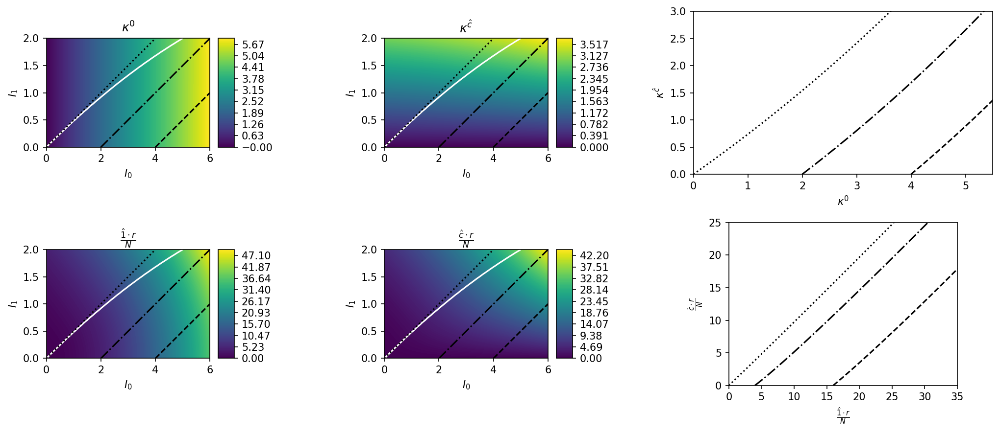

In [522]:
fig,axs = plt.subplots(2,3,figsize=(15,6),dpi=150,width_ratios=[2,2,3])
# fig.subplots_adjust(wspace=1)

conts = np.zeros_like(axs)
conts[0,0] = axs[0,0].contourf(I0s,I1s,k0s.T,
    levels=np.linspace(np.min(k0s[stab_idxs]),np.max(k0s[stab_idxs]),201),cmap='viridis')
conts[0,1] = axs[0,1].contourf(I0s,I1s,kcs.T,
    levels=np.linspace(np.min(kcs[stab_idxs]),np.max(kcs[stab_idxs]),201),cmap='viridis')
axs[0,2].plot(k0s[tune1_idxs],kcs[tune1_idxs],'k:')
axs[0,2].plot(k0s[tune2_idxs],kcs[tune2_idxs],'k-.')
axs[0,2].plot(k0s[tune3_idxs],kcs[tune3_idxs],'k--')
conts[1,0] = axs[1,0].contourf(I0s,I1s,r0s.T,
    levels=np.linspace(np.min(r0s[stab_idxs]),np.max(r0s[stab_idxs]),201),cmap='viridis')
conts[1,1] = axs[1,1].contourf(I0s,I1s,rcs.T,
    levels=np.linspace(np.min(rcs[stab_idxs]),np.max(rcs[stab_idxs]),201),cmap='viridis')
axs[1,2].plot(r0s[tune1_idxs],rcs[tune1_idxs],'k:')
axs[1,2].plot(r0s[tune2_idxs],rcs[tune2_idxs],'k-.')
axs[1,2].plot(r0s[tune3_idxs],rcs[tune3_idxs],'k--')

for i in range(2):
    for j in range(2):
        addcbar(fig,axs[i,j],conts[i,j],pad=-1)
        axs[i,j].set_xlabel(r'$I_0$')
        axs[i,j].set_ylabel(r'$I_1$')
        axs[i,j].set_aspect(2)
        axs[i,j].contour(I0s,I1s,(-k0s/(np.sqrt(2)*kcs)).T,levels=[-1],colors='w',linestyles='-')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - I0s[:,None]).T,levels=[0],colors='k',linestyles=':')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-2)).T,levels=[0],colors='k',linestyles='-.')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-4)).T,levels=[0],colors='k',linestyles='--')
    axs[i,2].set_aspect('equal')
    
axs[0,2].set_xlim(0,5.5)
axs[0,2].set_ylim(0,3)
axs[1,2].set_xlim(0,35)
axs[1,2].set_ylim(0,25)
    
axs[0,0].set_title(r'$\kappa^0$')
axs[0,1].set_title(r'$\kappa^{\hat{c}}$')
axs[0,2].set_xlabel(r'$\kappa^0$')
axs[0,2].set_ylabel(r'$\kappa^{\hat{c}}$')
axs[1,0].set_title(r'$\frac{\hat{1}\cdot r}{N}$')
axs[1,1].set_title(r'$\frac{\hat{c}\cdot r}{N}$')
axs[1,2].set_xlabel(r'$\frac{\hat{1}\cdot r}{N}$')
axs[1,2].set_ylabel(r'$\frac{\hat{c}\cdot r}{N}$')

fig.tight_layout()

# Build One Pop Ring Network with Cosine Connectivity

In [239]:
Nori = 180
Ncol = 1
N = Nori*Ncol

net = ring_network.RingNetwork(NC=[Ncol,Ncol],Nori=Nori)

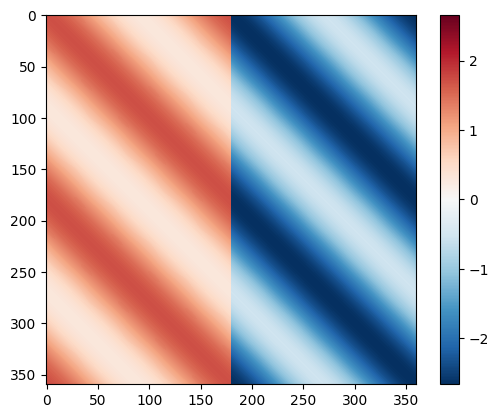

In [255]:
J = (1.0+0.5*np.sqrt(2)*np.cos(net.get_ori_diff()*2*np.pi/180)) / N# + 0.01*np.random.default_rng(0).normal(size=(N,N))/np.sqrt(N)
J[:,net.C_all[1]] *= -1.5
J[:,net.C_all[1]] -= 0.1/N
plt.imshow(np.block([[J[net.C_all[0],:][:,net.C_all[0]],J[net.C_all[0],:][:,net.C_all[1]]],
                     [J[net.C_all[1],:][:,net.C_all[0]],J[net.C_all[1],:][:,net.C_all[1]]]])*N,
           cmap='RdBu_r',vmin=-np.max(np.abs(J*N)),vmax=np.max(np.abs(J*N)))
plt.colorbar()

# Calculate Singular Vectors

In [256]:
U,S,Vh = np.linalg.svd(J)

nrank = 4

m = U[:,:nrank].T*np.sqrt(N)*np.sqrt(S[:nrank,None])
n = Vh[:nrank,:]*np.sqrt(N)*np.sqrt(S[:nrank,None])

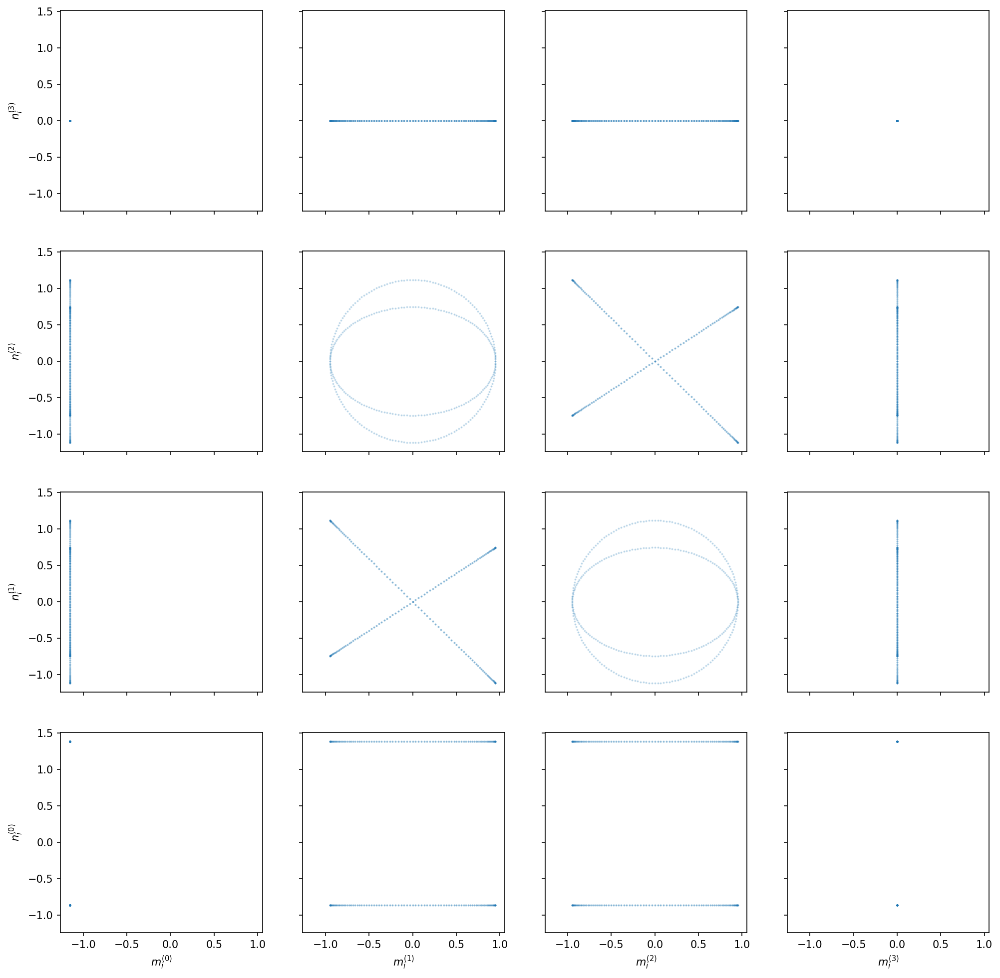

In [257]:
fig,axs = plt.subplots(nrank,nrank,figsize=(4*nrank,4*nrank),dpi=150,sharex=True,sharey=True)

for i in range(nrank):
    axs[nrank-1-i,0].set_ylabel(r'$n_i^{('+str(i)+r')}$')
    axs[nrank-1,i].set_xlabel(r'$m_i^{('+str(i)+r')}$')
    for j in range(nrank):
        axs[nrank-1-i,j].scatter(m[j],n[i],s=1,alpha=0.2)

# 2 Pop Numerics

In [5]:
def stab_fix_pt_2pop_dkapdt(t,kap,J0,J1,I0,I1,n):
    ovrlpsE = rate_overlap(kap[0],kap[1],0,n)
    ovrlpsI = rate_overlap(kap[2],kap[3],0,n)
    return np.array([I0[0]+J0[0,0]*ovrlpsE[0]+J0[0,1]*ovrlpsI[0],
                     I1[0]*np.sqrt(2)+J1[0,0]*ovrlpsE[1]+J1[0,1]*ovrlpsI[1],
                     I0[1]+J0[1,0]*ovrlpsE[0]+J0[1,1]*ovrlpsI[0],
                     I1[1]*np.sqrt(2)+J1[1,0]*ovrlpsE[1]+J1[1,1]*ovrlpsI[1]]) - kap

In [6]:
from tqdm import tqdm

J0 = 1.0*0.04*np.array([[1,-2],[1,-2]])
J1 = 0.5*0.04*np.array([[1,-2],[1,-2]])
I0s = np.linspace(0,6,31)
I1s = np.linspace(0,2,21)

k0Es = np.zeros((len(I0s),len(I1s)))
kcEs = np.zeros((len(I0s),len(I1s)))
ksEs = np.zeros((len(I0s),len(I1s)))
k0Is = np.zeros((len(I0s),len(I1s)))
kcIs = np.zeros((len(I0s),len(I1s)))
ksIs = np.zeros((len(I0s),len(I1s)))
r0Es = np.zeros((len(I0s),len(I1s)))
rcEs = np.zeros((len(I0s),len(I1s)))
rsEs = np.zeros((len(I0s),len(I1s)))
r0Is = np.zeros((len(I0s),len(I1s)))
rcIs = np.zeros((len(I0s),len(I1s)))
rsIs = np.zeros((len(I0s),len(I1s)))
err = np.zeros((len(I0s),len(I1s)))

for i,I0 in tqdm(enumerate(I0s)):
    for j,I1 in tqdm(enumerate(I1s),leave=False):
        sol = solve_ivp(stab_fix_pt_2pop_dkapdt,(0,50),[-0.1,0.01,-0.1,0.01],args=(J0,J1,I0*np.array([1,0.5]),I1*np.array([1,0.5]),2))
        k0Es[i,j] = sol.y[0,-1]
        kcEs[i,j] = sol.y[1,-1]
        ksEs[i,j] = 0
        k0Is[i,j] = sol.y[2,-1]
        kcIs[i,j] = sol.y[3,-1]
        ksIs[i,j] = 0
        
        r0Es[i,j],rcEs[i,j],rsEs[i,j] = rate_overlap(k0Es[i,j],kcEs[i,j],ksEs[i,j],2)
        r0Is[i,j],rcIs[i,j],rsIs[i,j] = rate_overlap(k0Is[i,j],kcIs[i,j],ksIs[i,j],2)
        err[i,j] = np.linalg.norm(stab_fix_pt_2pop_dkapdt(0,[k0Es[i,j],kcEs[i,j],k0Is[i,j],kcIs[i,j]],J0,J1,I0*np.array([1,0.5]),I1*np.array([1,0.5]),2))
        
stab_idxs = err < 1e-2
tune1_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==0),np.isclose(I1s[None,:]/I0s[:,None],0.5))
tune2_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==2),np.isclose(I1s[None,:]/(I0s[:,None]-2),0.5))
tune3_idxs = np.logical_or(np.logical_and(I1s[None,:]==0,I0s[:,None]==4),np.isclose(I1s[None,:]/(I0s[:,None]-4),0.5))

0it [00:00, ?it/s]

5it [00:10,  2.14s/it]


KeyboardInterrupt: 

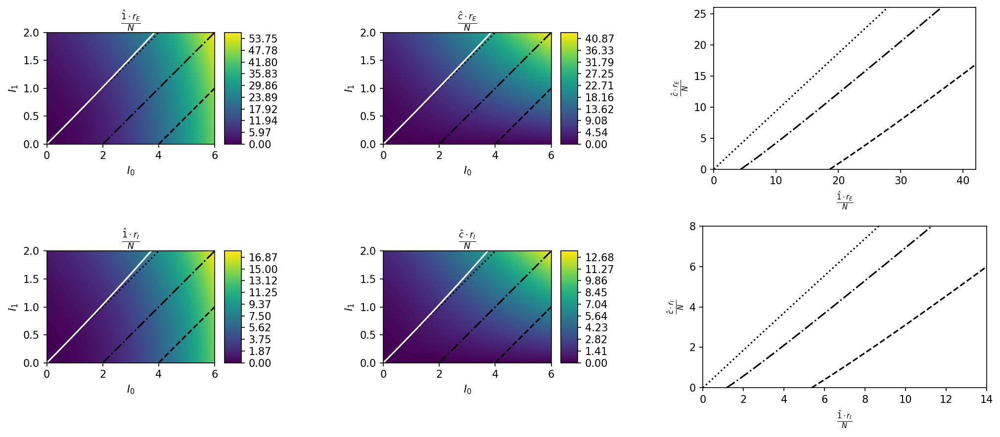

In [ ]:
fig,axs = plt.subplots(2,3,figsize=(15,6),dpi=150,width_ratios=[2,2,3])
# fig.subplots_adjust(wspace=1)

conts = np.zeros_like(axs)
conts[0,0] = axs[0,0].contourf(I0s,I1s,r0Es.T,
    levels=np.linspace(np.min(r0Es[stab_idxs]),np.max(r0Es[stab_idxs]),201),cmap='viridis')
conts[0,1] = axs[0,1].contourf(I0s,I1s,rcEs.T,
    levels=np.linspace(np.min(rcEs[stab_idxs]),np.max(rcEs[stab_idxs]),201),cmap='viridis')
axs[0,2].plot(r0Es[tune1_idxs],rcEs[tune1_idxs],'k:')
axs[0,2].plot(r0Es[tune2_idxs],rcEs[tune2_idxs],'k-.')
axs[0,2].plot(r0Es[tune3_idxs],rcEs[tune3_idxs],'k--')
conts[1,0] = axs[1,0].contourf(I0s,I1s,r0Is.T,
    levels=np.linspace(np.min(r0Is[stab_idxs]),np.max(r0Is[stab_idxs]),201),cmap='viridis')
conts[1,1] = axs[1,1].contourf(I0s,I1s,rcIs.T,
    levels=np.linspace(np.min(rcIs[stab_idxs]),np.max(rcIs[stab_idxs]),201),cmap='viridis')
axs[1,2].plot(r0Is[tune1_idxs],rcIs[tune1_idxs],'k:')
axs[1,2].plot(r0Is[tune2_idxs],rcIs[tune2_idxs],'k-.')
axs[1,2].plot(r0Is[tune3_idxs],rcIs[tune3_idxs],'k--')

for i in range(2):
    for j in range(2):
        addcbar(fig,axs[i,j],conts[i,j],pad=-1)
        axs[i,j].set_xlabel(r'$I_0$')
        axs[i,j].set_ylabel(r'$I_1$')
        axs[i,j].set_aspect(2)
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - I0s[:,None]).T,levels=[0],colors='k',linestyles=':')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-2)).T,levels=[0],colors='k',linestyles='-.')
        axs[i,j].contour(I0s,I1s,(I1s[None,:]/0.5 - (I0s[:,None]-4)).T,levels=[0],colors='k',linestyles='--')
    axs[i,2].set_aspect('equal')
for j in range(2):
    axs[0,j].contour(I0s,I1s,(-k0Es/(np.sqrt(2)*kcEs)).T,levels=[-1],colors='w',linestyles='-')
    axs[1,j].contour(I0s,I1s,(-k0Is/(np.sqrt(2)*kcIs)).T,levels=[-1],colors='w',linestyles='-')
    
axs[0,2].set_xlim(0,42)
axs[0,2].set_ylim(0,26)
axs[1,2].set_xlim(0,14)
axs[1,2].set_ylim(0,8)
    
axs[0,0].set_title(r'$\frac{\hat{1}\cdot r_E}{N}$')
axs[0,1].set_title(r'$\frac{\hat{c}\cdot r_E}{N}$')
axs[0,2].set_xlabel(r'$\frac{\hat{1}\cdot r_E}{N}$')
axs[0,2].set_ylabel(r'$\frac{\hat{c}\cdot r_E}{N}$')
axs[1,0].set_title(r'$\frac{\hat{1}\cdot r_I}{N}$')
axs[1,1].set_title(r'$\frac{\hat{c}\cdot r_I}{N}$')
axs[1,2].set_xlabel(r'$\frac{\hat{1}\cdot r_I}{N}$')
axs[1,2].set_ylabel(r'$\frac{\hat{c}\cdot r_I}{N}$')

fig.tight_layout()

In [601]:
fig,axs = plt.subplots(1,2,figsize=(14,6),dpi=1000,subplot_kw=dict(projection='3d'))
fig.subplots_adjust(wspace=-0.5)

for tht in np.arange(20)/20*2*np.pi:
    axs[0].scatter(r0Es[tune1_idxs][:11],rcEs[tune1_idxs][:11]*np.cos(tht),rcEs[tune1_idxs][:11]*np.sin(tht),c='C0')
    axs[0].scatter(r0Es[tune2_idxs][:11],rcEs[tune2_idxs][:11]*np.cos(tht),rcEs[tune2_idxs][:11]*np.sin(tht),c='C1')
    axs[0].scatter(r0Es[tune3_idxs][:11],rcEs[tune3_idxs][:11]*np.cos(tht),rcEs[tune3_idxs][:11]*np.sin(tht),c='C2')
    axs[1].scatter(r0Is[tune1_idxs][:11],rcIs[tune1_idxs][:11]*np.cos(tht),rcIs[tune1_idxs][:11]*np.sin(tht),c='C0')
    axs[1].scatter(r0Is[tune2_idxs][:11],rcIs[tune2_idxs][:11]*np.cos(tht),rcIs[tune2_idxs][:11]*np.sin(tht),c='C1')
    axs[1].scatter(r0Is[tune3_idxs][:11],rcIs[tune3_idxs][:11]*np.cos(tht),rcIs[tune3_idxs][:11]*np.sin(tht),c='C2')

axs[0].set_xlabel(r'$\hat{1}\cdot r_E / N$')
axs[0].set_ylabel(r'$\hat{c}\cdot r_E / N$')
axs[0].set_zlabel(r'$\hat{s}\cdot r_E / N$')
# axs[0].zaxis.labelpad=-4
axs[1].set_xlabel(r'$\hat{1}\cdot r_I / N$')
axs[1].set_ylabel(r'$\hat{c}\cdot r_I / N$')
axs[1].set_zlabel(r'$\hat{s}\cdot r_I / N$')
# axs[1].zaxis.labelpad=-4

axs[0].view_init(elev=22.5, azim=-75)
axs[1].view_init(elev=22.5, azim=-75)

fig.tight_layout()

In [591]:
rs = np.zeros((3,60,11,360))

for thtidx,tht in enumerate(np.arange(60)/60*2*np.pi):
    for tidx in range(11):
        rs[0,thtidx,tidx,:180] = 0.04*np.fmax(0,k0Es[tune1_idxs][tidx]+np.sqrt(2)*kcEs[tune1_idxs][tidx]*np.cos(np.arange(180)/180*2*np.pi-tht))**2
        rs[0,thtidx,tidx,180:] = 0.04*np.fmax(0,k0Is[tune1_idxs][tidx]+np.sqrt(2)*kcIs[tune1_idxs][tidx]*np.cos(np.arange(180)/180*2*np.pi-tht))**2
        rs[1,thtidx,tidx,:180] = 0.04*np.fmax(0,k0Es[tune2_idxs][tidx]+np.sqrt(2)*kcEs[tune2_idxs][tidx]*np.cos(np.arange(180)/180*2*np.pi-tht))**2
        rs[1,thtidx,tidx,180:] = 0.04*np.fmax(0,k0Is[tune2_idxs][tidx]+np.sqrt(2)*kcIs[tune2_idxs][tidx]*np.cos(np.arange(180)/180*2*np.pi-tht))**2
        rs[2,thtidx,tidx,:180] = 0.04*np.fmax(0,k0Es[tune3_idxs][tidx]+np.sqrt(2)*kcEs[tune3_idxs][tidx]*np.cos(np.arange(180)/180*2*np.pi-tht))**2
        rs[2,thtidx,tidx,180:] = 0.04*np.fmax(0,k0Is[tune3_idxs][tidx]+np.sqrt(2)*kcIs[tune3_idxs][tidx]*np.cos(np.arange(180)/180*2*np.pi-tht))**2

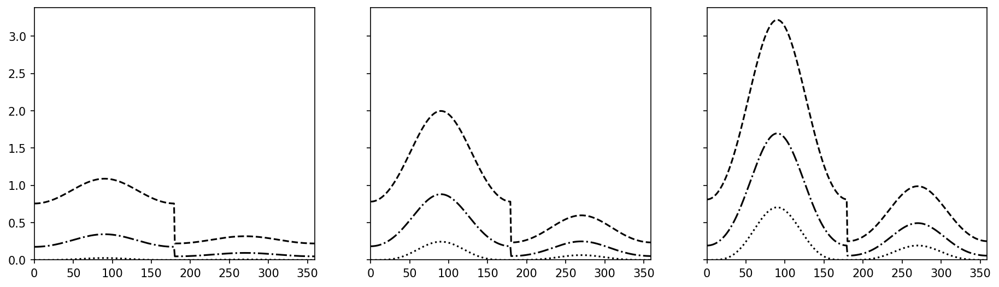

In [588]:
fig,axs = plt.subplots(1,3,figsize=(15,4),dpi=150,sharex=True,sharey=True)

for i,idx in enumerate([2,6,10]):
    axs[i].plot(rs[0,10,idx],'k:')
    axs[i].plot(rs[1,10,idx],'k-.')
    axs[i].plot(rs[2,10,idx],'k--')
    
for i in range(3):
    axs[i].set_xlim(0,359)
    axs[i].set_ylim(0,None)

In [602]:
from sklearn.decomposition import PCA

pca_dim = 3

pca = PCA(n_components=pca_dim)
rs_pca = pca.fit_transform(rs.reshape((-1,360))).reshape((3,60,11,pca_dim))

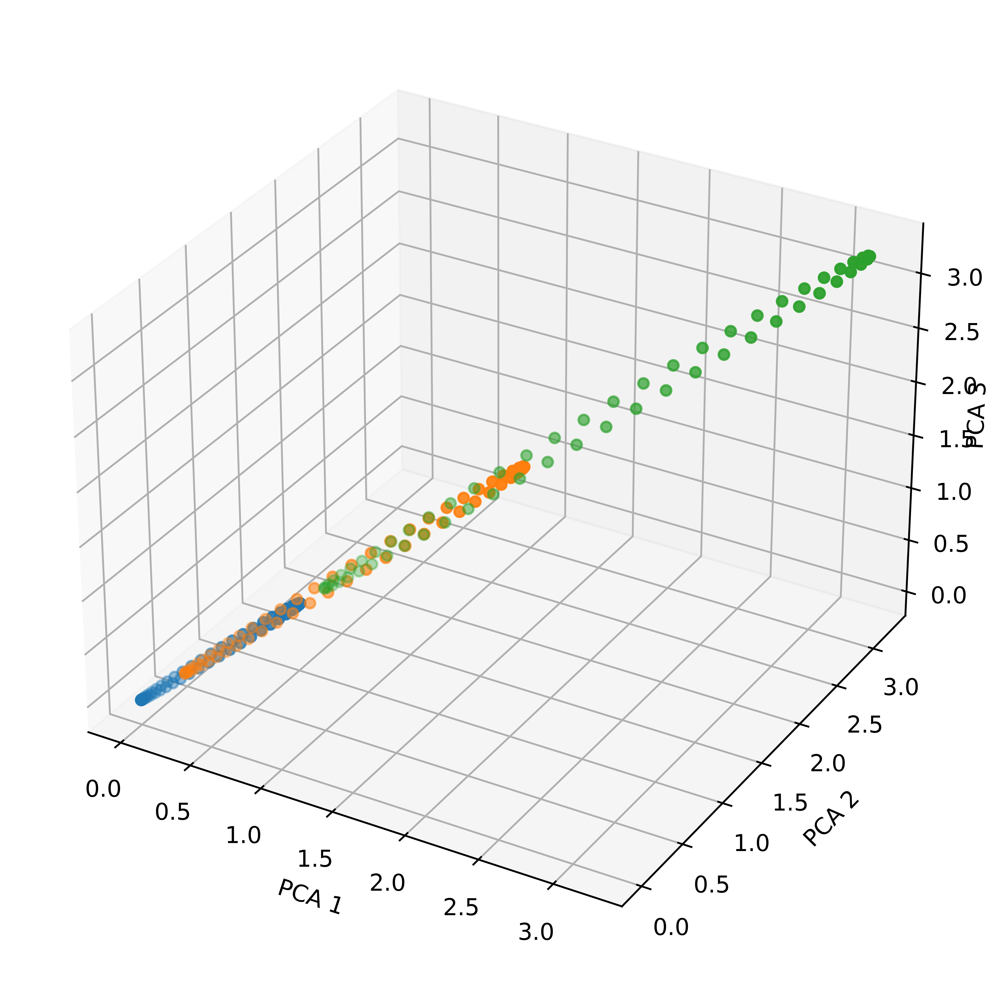

In [604]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

ax.scatter(rs[0,:,-1,0].flatten(),rs[0,:,-1,1].flatten(),rs[0,:,-1,2].flatten(),c='C0')
ax.scatter(rs[1,:,-1,0].flatten(),rs[1,:,-1,1].flatten(),rs[1,:,-1,2].flatten(),c='C1')
ax.scatter(rs[2,:,-1,0].flatten(),rs[2,:,-1,1].flatten(),rs[2,:,-1,2].flatten(),c='C2')

ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
ax.zaxis.labelpad=-4

# ax.view_init(elev=45, azim=0)

fig.tight_layout()

# Investigate Opto Perturbation

In [7]:
from tqdm import tqdm

J0 = 1.0*0.04*np.array([[1,-2],[2,-2]])
J1 = 0.5*0.04*np.array([[1,-2],[2,-2]])
I1s = np.linspace(0,2,21)
I0s = 2*I1s + 4

opto = 0.1*4

k0Es = np.zeros((len(I0s),2))
kcEs = np.zeros((len(I0s),2))
ksEs = np.zeros((len(I0s),2))
k0Is = np.zeros((len(I0s),2))
kcIs = np.zeros((len(I0s),2))
ksIs = np.zeros((len(I0s),2))
r0Es = np.zeros((len(I0s),2))
rcEs = np.zeros((len(I0s),2))
rsEs = np.zeros((len(I0s),2))
r0Is = np.zeros((len(I0s),2))
rcIs = np.zeros((len(I0s),2))
rsIs = np.zeros((len(I0s),2))
err = np.zeros((len(I0s),2))

for i,I0 in tqdm(enumerate(I0s)):
    I1 = I1s[i]
    for j in range(2):
        sol = solve_ivp(stab_fix_pt_2pop_dkapdt,(0,50),[-0.1,0.01,-0.1,0.01],args=(J0,J1,
                                                I0*np.array([1,0.5])+j*opto*np.array([1,0]),I1*np.array([1,0.5]),2))
        k0Es[i,j] = sol.y[0,-1]
        kcEs[i,j] = sol.y[1,-1]
        ksEs[i,j] = 0
        k0Is[i,j] = sol.y[2,-1]
        kcIs[i,j] = sol.y[3,-1]
        ksIs[i,j] = 0
        
        r0Es[i,j],rcEs[i,j],rsEs[i,j] = rate_overlap(k0Es[i,j],kcEs[i,j],ksEs[i,j],2)
        r0Is[i,j],rcIs[i,j],rsIs[i,j] = rate_overlap(k0Is[i,j],kcIs[i,j],ksIs[i,j],2)
        err[i,j] = np.linalg.norm(stab_fix_pt_2pop_dkapdt(0,[k0Es[i,j],kcEs[i,j],k0Is[i,j],kcIs[i,j]],J0,J1,
                                                I0*np.array([1,0.5])+j*opto*np.array([1,0]),I1*np.array([1,0.5]),2))
        
stab_idxs = err < 1e-2

0it [00:00, ?it/s]

21it [00:01, 14.63it/s]


In [8]:
rs = np.zeros((11,360,2))

for tidx in range(11):
    rs[tidx,:180,:] = 0.04*np.fmax(0,k0Es[tidx,:]+np.sqrt(2)*kcEs[tidx,:]*np.cos(np.arange(180)[:,None]/180*2*np.pi-np.pi))**2
    rs[tidx,180:,:] = 0.04*np.fmax(0,k0Is[tidx,:]+np.sqrt(2)*kcIs[tidx,:]*np.cos(np.arange(180)[:,None]/180*2*np.pi-np.pi))**2

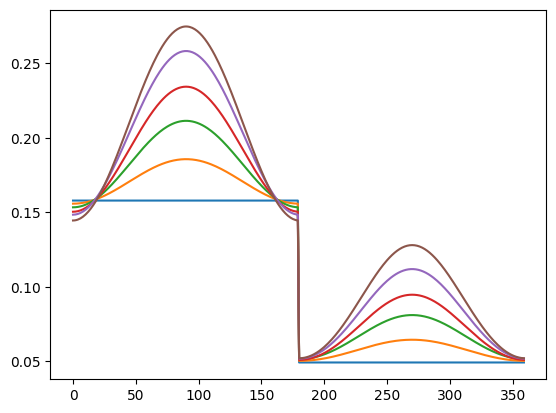

In [9]:
plt.plot(rs[::2,:,1].T-rs[::2,:,0].T)

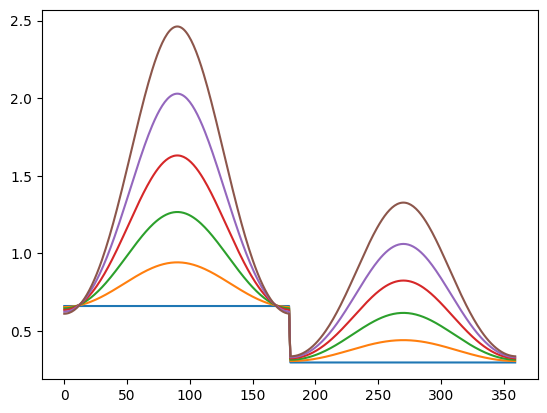

In [10]:
plt.plot(rs[::2,:,0].T)